команда: 13  
Участники: Цыгляев Владислав, Габдрахманов Рустам, Лебедев Иван

# Источники


1) https://docs.opencv.org/4.x/d4/dc6/tutorial_py_template_matching.html

2) https://en.wikipedia.org/wiki/Template_matching

3) https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html

4) https://www.geeksforgeeks.org/sift-interest-point-detector-using-python-opencv/

5) https://en.wikipedia.org/wiki/Scale-invariant_feature_transform

6) https://habr.com/ru/companies/joom/articles/445354/

8) https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html

# Теория


## template matching

template matching — метод, основанный на нахождении места на изображении, наиболее похожем на шаблон. “Похожесть” изображения задается определенной метрикой. То есть, шаблон "накладывается" на изображение, и считается расхождение между изображением и и шаблоном. Положение шаблона, при котором это расхождение будет минимальным, и будет означать место искомого объекта.


В качестве метрики можно использовать разные варианты, например — сумма квадратов разниц между шаблоном и картинкой (sum of squared differences, SSD), или использовать кросс-корреляцию (cross-correlation, CCORR). Пусть f и g — изображение и шаблон размерами (k, l) и (m, n) соответственно (каналы цвета пока будем игнорировать); i,j — позиция на изображении, к которой мы "приложили" шаблон.

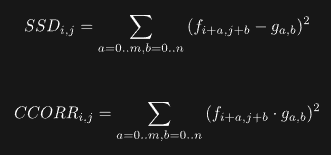

Кросс-корреляция на самом деле является сверткой двух изображений. Свёртки можно реализовать быстро, используя быстрое преобразование Фурье. Согласно теореме о свёртке, после преобразования Фурье свёртка превращается в простое поэлементное умножение:

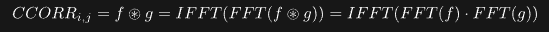


В OpenCV уже реализован поиск шаблона с помощью метода matchTemplate (кстати используется именно реализация через FFT), использующий разные метрики расхождений:

- CV_TM_SQDIFF — сумма квадратов разниц значений пикселей
- CV_TM_SQDIFF_NORMED — сумма квадрат разниц цветов, отнормированная в диапазон 0..1.
- CV_TM_CCORR — сумма поэлементных произведений шаблона и сегмента картинки
- CV_TM_CCORR_NORMED — сумма поэлементных произведений, отнормированное в диапазон -1..1.
- CV_TM_CCOEFF — кросс-коррелация изображений без среднего
- CV_TM_CCOEFF_NORMED — кросс-корреляция между изображениями без среднего, отнормированная в -1..1 (корреляция Пирсона)


Можно заметить, что эти метрики требуют попиксельного соответствия шаблона в искомом изображении. Любое отклонение гаммы, света или размера приведут к тому, что методы не будут работать.

Проблему разного цвета и света можно решить применив фильтр нахождения граней (edge detection filter). Этот метод оставляет лишь информацию о том, в каком месте изображения находились резкие перепады цвета.

Также существует проблема разных размеров, однако она уже была решена. Лог-полярная трансформация преобразует картинку в пространство, в котором изменение масштаба и поворот будут проявляться как смещение. Используя эту трансформацию, мы можем восстановить масштаб и угол. После этого, отмасштабировав и повернув шаблон, можно найти и позицию шаблона на исходной картинке. В литературе рассматривается случай, когда по горизонтали и вертикали шаблон изменяется пропорционально, и при этом коэффициент масштаба варьируется в небольших пределах (2.0… 0.8). К сожалению, изменение размеров шаблона может быть бо́льшим и непропорциональным, что может привести к некорректному результату.



## SIFT

Вместо того, чтобы искать шаблон целиком, можно найти его типичные части, например, углы объекта. Кажется, что найти углы проще, так как это мелкие (а значит, простые) объекты. Класс методов нахождения ключевых точек называется “keypoint detection”, а алгоритмы сравнения и поиска картинок с помощью ключевых точек — “keypoint matching”. Поиск шаблона на картинке сводится к применению алгоритма обнаружения ключевых точек к шаблону и картинке, и сопоставлению ключевых точек шаблона и картинки.

Обычно “ключевые точки” находят автоматически, находя пиксели, окружение которых которых обладает определёнными свойствами. Было придумано множество способов и критериев их нахождения. Все эти алгоритмы являются эвристиками, которые находят какие-то характерные элементы изображения, как правило — углы или резкие перепады цвета. Хороший детектор должен работать быстро, и быть устойчивым к трансформациям картинки (при изменении картинки ключевые точки не должны переставать находиться/двигаться).

SIFT (Scale-invariant feature transform) - один из алгоритмов нахождения ключевых точек, который может учитывать изменение масштаба объекта. Возьмем изображение, из которого извлекаем ключевые точки, и начнём постепенно уменьшать его размер с каким-то небольшим шагом, и для каждого варианта масштаба будем находить ключевые точки. Масштабирование — тяжелая процедура, но уменьшение в 2/4/8/… раз можно провести эффективно, пропуская пиксели (в SIFT эти кратные масштабы называются “октавами”). Промежуточные масштабы можно аппроксимировать, применяя к картинке гауссовский блюр с разным размером ядра. Как мы уже описали выше, это можно сделать вычислительно эффективно. Результат будет похож на то, как если бы мы сначала уменьшили картинку, а потом увеличили ее до исходного размера — мелкие детали теряются, изображение становится “замыленным”.

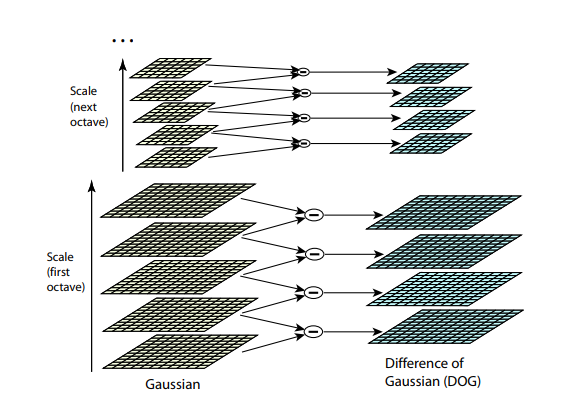

После этой процедуры посчитаем разницу между соседними масштабами. Большие (по модулю) значения в этой разнице получатся, если какая-то мелкая деталь перестает быть видна на следующем уровне масштаба, или, наоборот, следующий уровень масштаба начинает захватывать какую-то деталь, которая на предыдущем не была видна. Этот прием называется DoG, Difference of Gaussian. Можно считать, что большое значение в этой разнице уже является сигналом того, что в этом месте на изображении есть что-то интересное. Но нас интересует тот масштаб, для которого эта ключевая точка будет наиболее выразительной. Для этого будем считать ключевой точкой не только точку, которая отличается от своего окружения, но и отличается сильнее всего среди разных масштабов изображений. Другими словами, выбирать ключевую точку мы будем не только в пространстве X и Y, а в пространстве $ (X, Y, Scale) $. В SIFT это делается путём нахождения точек в DoG (Difference of Gaussians), которые являются локальными максимумами или минимумами в $ 3x3x3 $ кубе пространства $ (X, Y, Scale) $ вокруг неё:

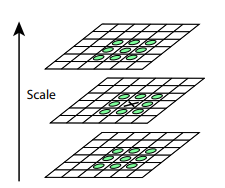

 Обычно вышеописанные методы применяют для того, чтобы найти объект из шаблона на снимке, на котором он может быть частично скрыт, быть повернут, или немного искажен. 

 Метод хорош, и корректно отрабатывает ситуации, когда искомый объект повернут, его размер изменен, или объект частично скрыт (что хорошо для поиска сложных объектов, или ценника, например). Однако, если на объекте мало точек, за которые можно "зацепиться", или форма объекта меняется слишком сильно, то ключевые точки и их на шаблоне и изображении могут не совпасть. Также, фон с большим количеством мелких деталей может сместить "ключевые точки" или изменить их дескрипторы.

# Реализация

## template matching

In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

['./template_3_1.png', './template_3_2.png', './template_3_3.png', './template_3_4.png', './template_3_5.png', './template_3_6.png', './template_3_7.png', './template_3_8.png', './template_3_9.png', './template_3_10.png', './template_3_11.png']


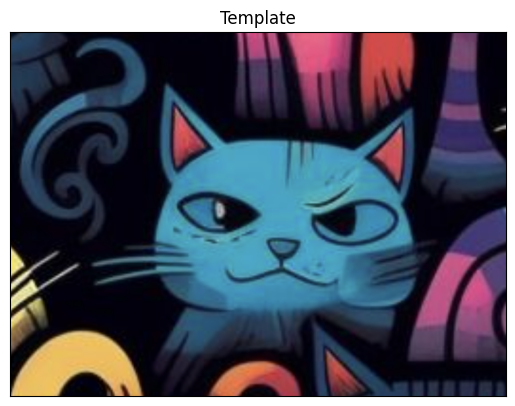

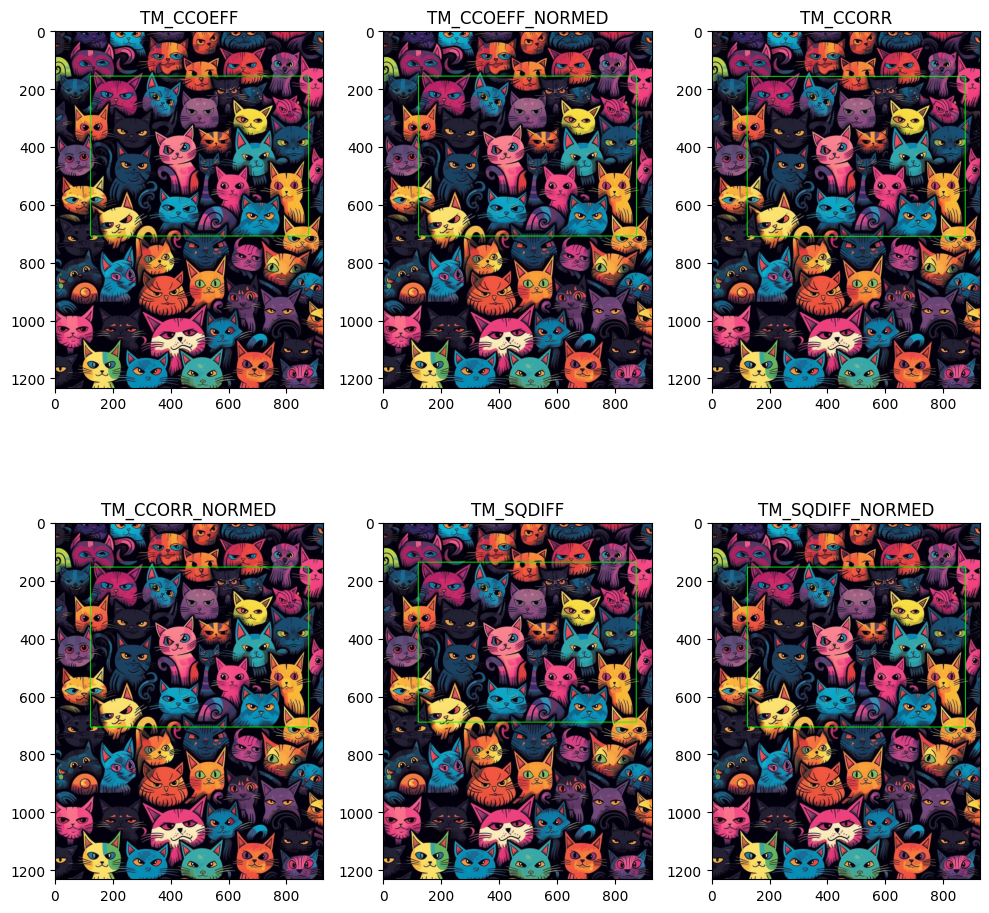

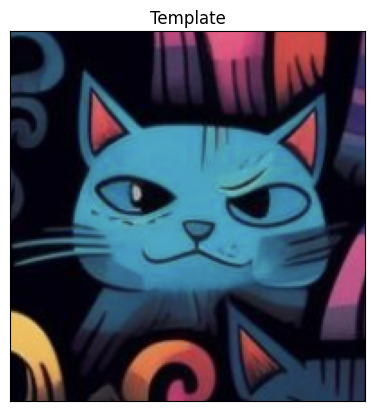

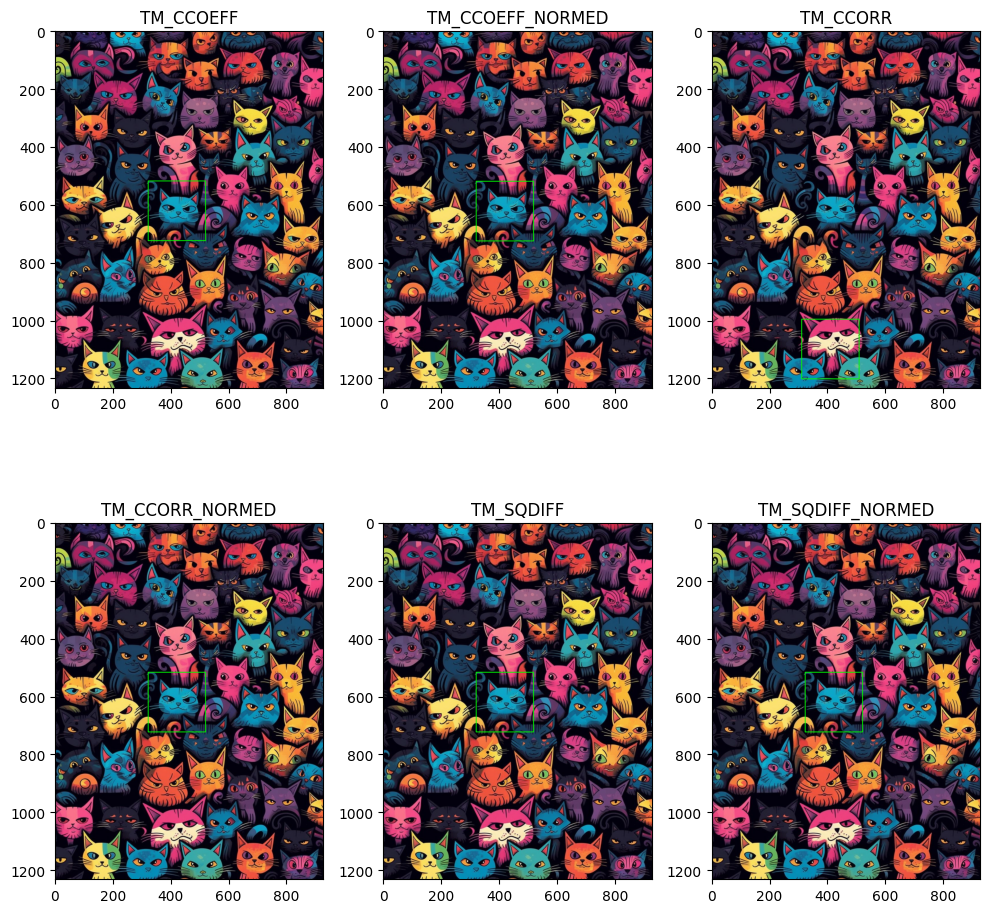

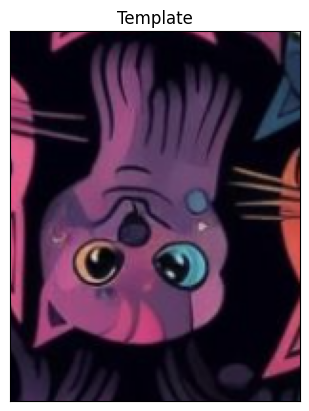

...

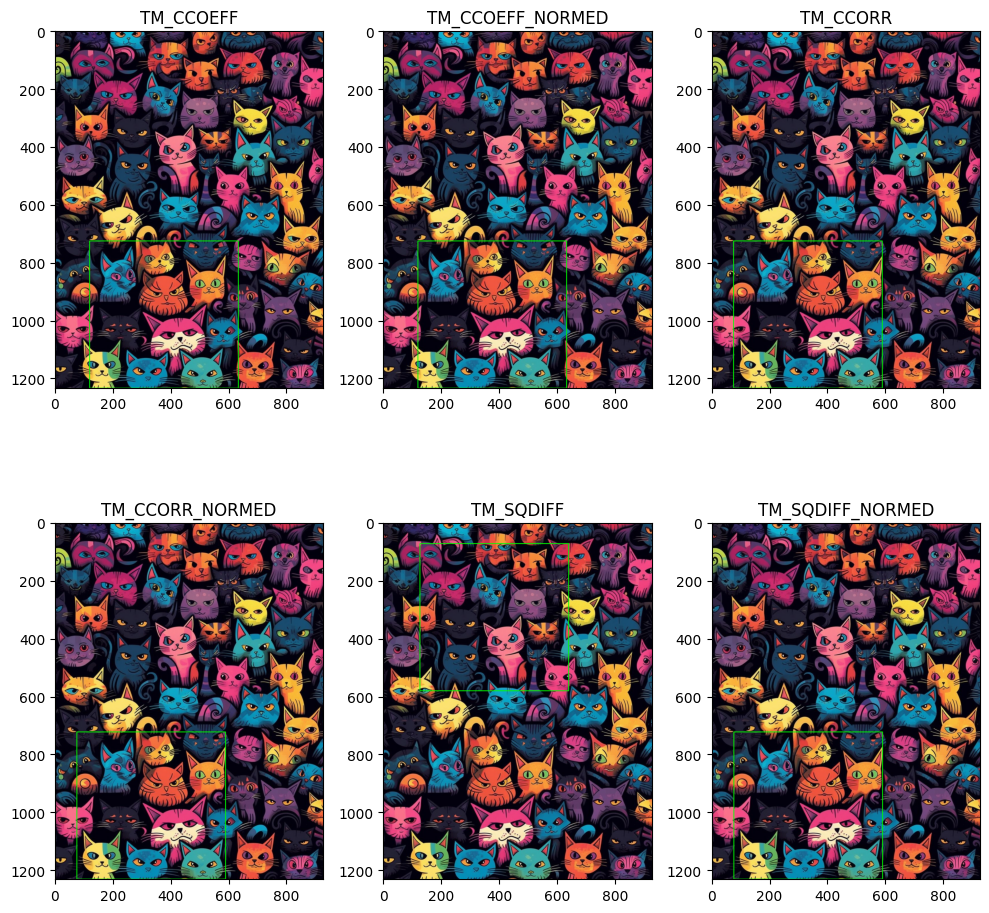

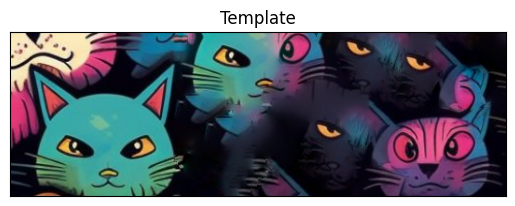

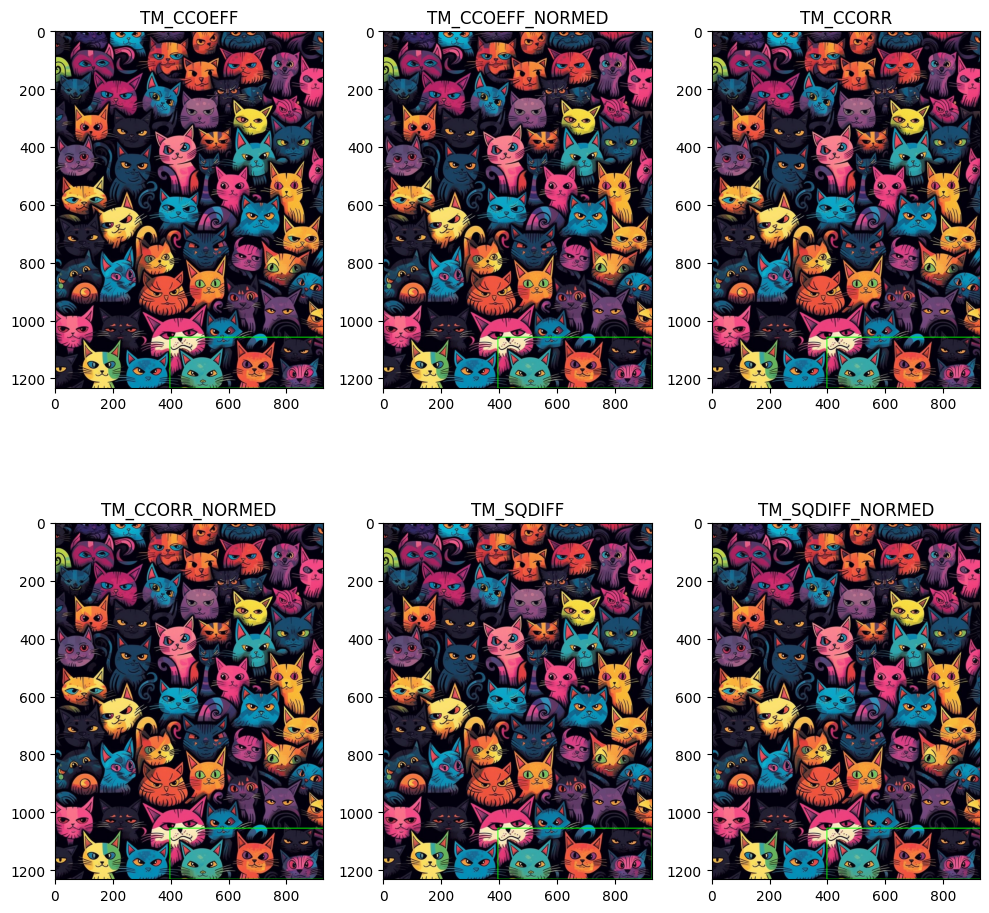

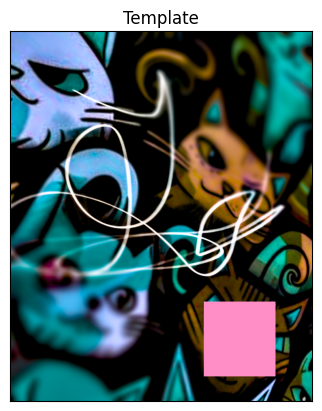

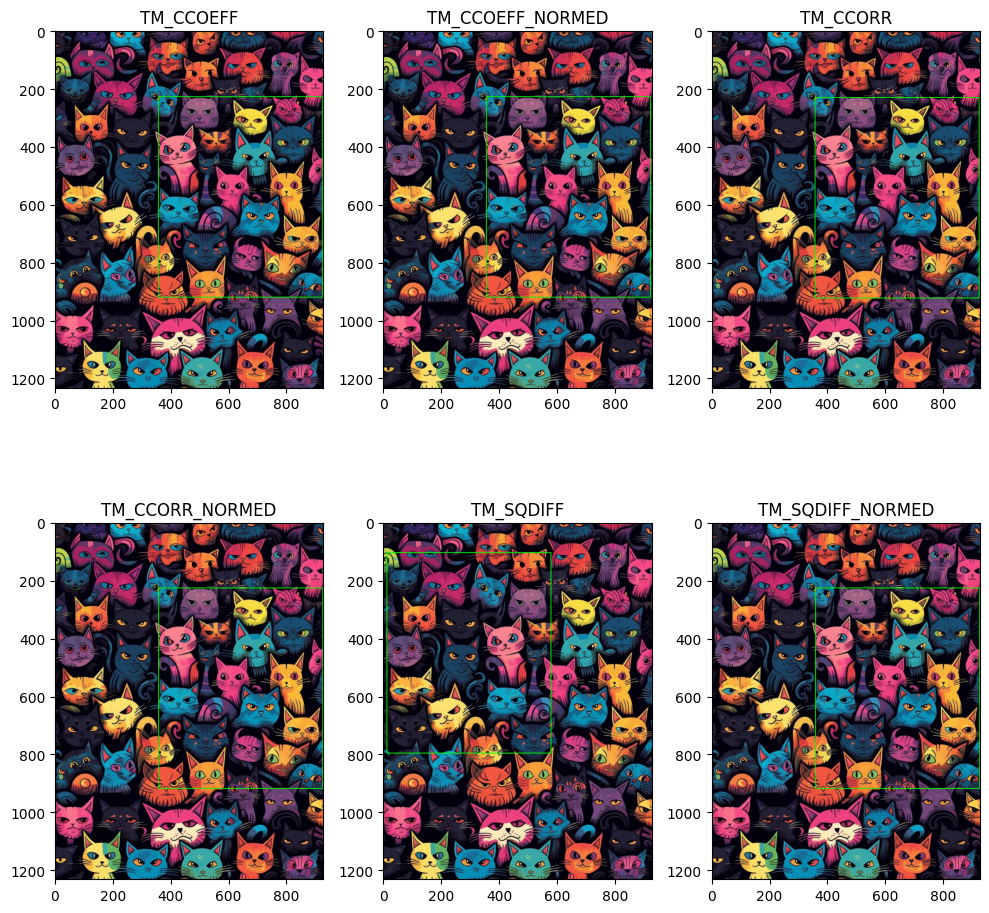

In [ ]:

IMAGE_COUNT = 11

template_array = []

for number in range(1, IMAGE_COUNT+1):
    template_array.append(f"../images/lab_2/template_3_{number}.png")

print(template_array)

image = cv2.imread('../images/lab_2/image_3.jpg')

methods = ['TM_CCOEFF', 'TM_CCOEFF_NORMED', 'TM_CCORR',
        'TM_CCORR_NORMED', 'TM_SQDIFF', 'TM_SQDIFF_NORMED']



for element in template_array:
    template = cv2.imread(element)
    template_rgb = cv2.cvtColor(template, cv2.COLOR_BGR2RGB)
    plt.imshow(template_rgb)
    plt.title('Template'), plt.xticks([]), plt.yticks([])
    plt.show()

    fig, axs = plt.subplots(2, 3, figsize=(10, 10))

    for i, ax in enumerate(axs.flatten()):

        image_buff = image.copy()
        image_rgb = cv2.cvtColor(image_buff, cv2.COLOR_BGR2RGB)

        method = getattr(cv2, methods[i])

        result = cv2.matchTemplate(image, template, method)

        # Порог для отделения результатов

        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            y_locations, x_locations = np.where(result == np.min(result))
        else:
            y_locations, x_locations = np.where(result == np.max(result))


        # Отрисовка прямоугольников вокруг найденных шаблонов
        for (x, y) in zip(x_locations, y_locations):
            cv2.rectangle(image_rgb, (x, y), (x + template.shape[1], y + template.shape[0]), (0, 255, 0), 2)

        ax.imshow(image_rgb)
        ax.set_title(f"{methods[i]}")

    plt.tight_layout()
    plt.show()
    

## SIFT

['../images/lab_2/template_3_1.png', '../images/lab_2/template_3_2.png', '../images/lab_2/template_3_3.png', '../images/lab_2/template_3_4.png', '../images/lab_2/template_3_5.png', '../images/lab_2/template_3_6.png', '../images/lab_2/template_3_7.png', '../images/lab_2/template_3_8.png', '../images/lab_2/template_3_9.png', '../images/lab_2/template_3_10.png', '../images/lab_2/template_3_11.png']


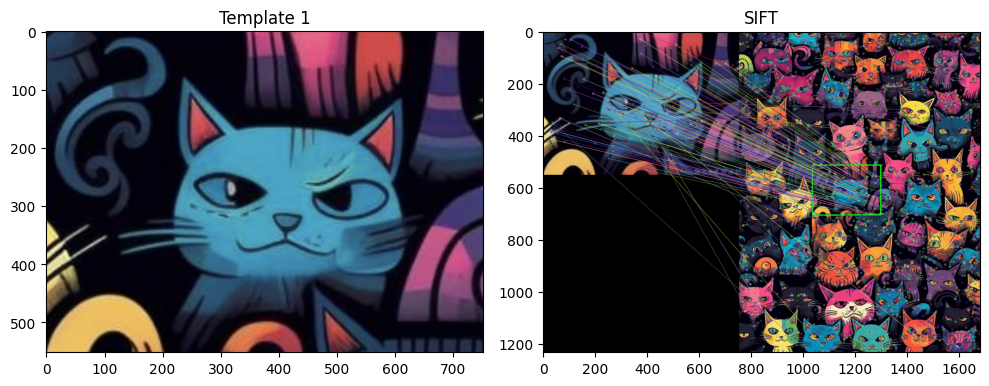

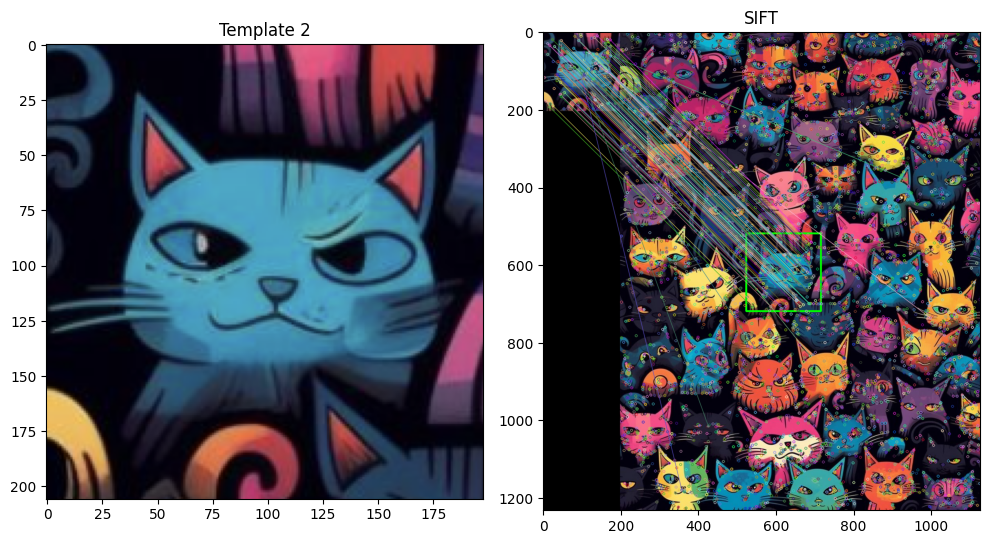

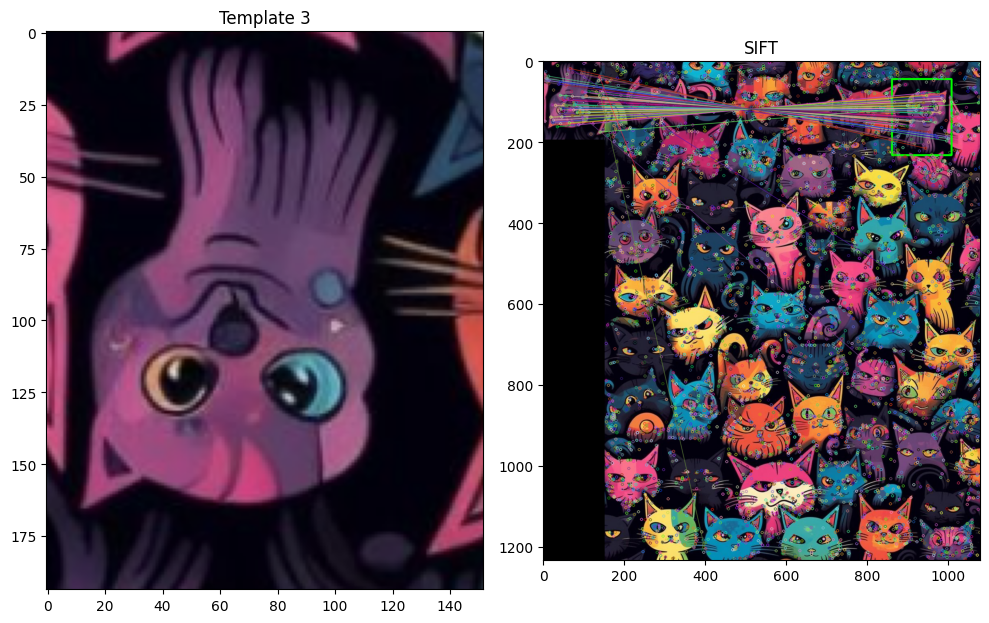

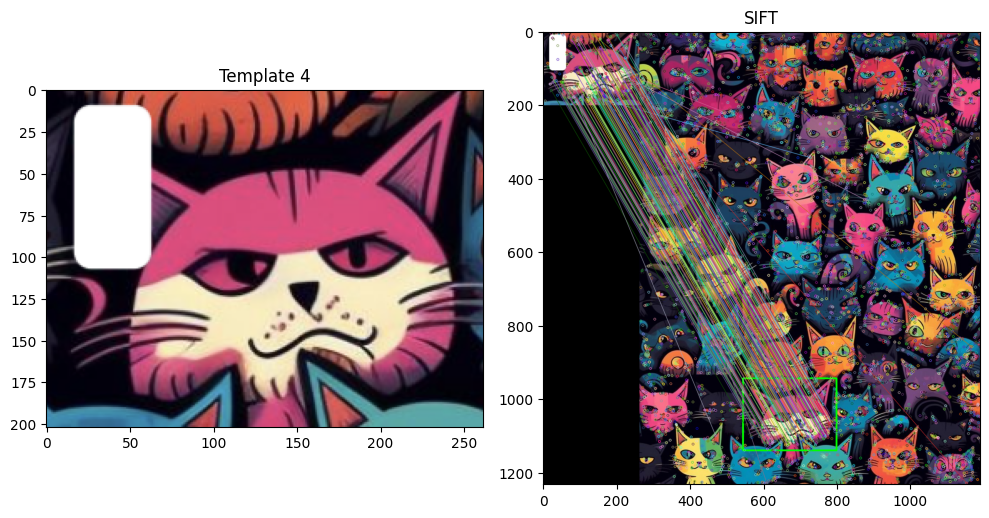

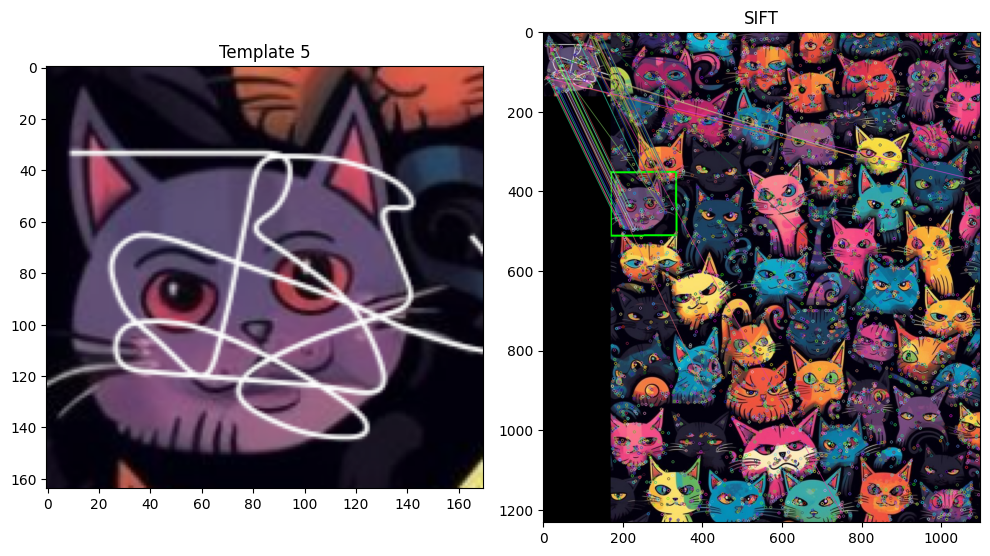

...

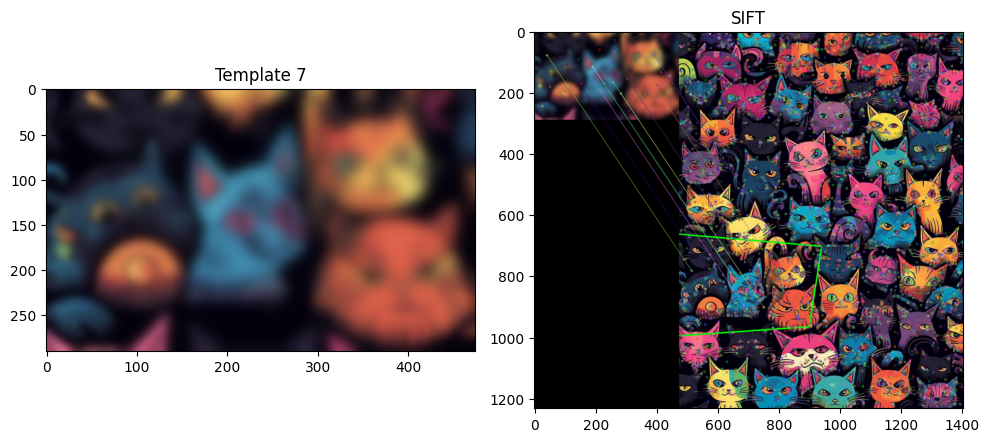

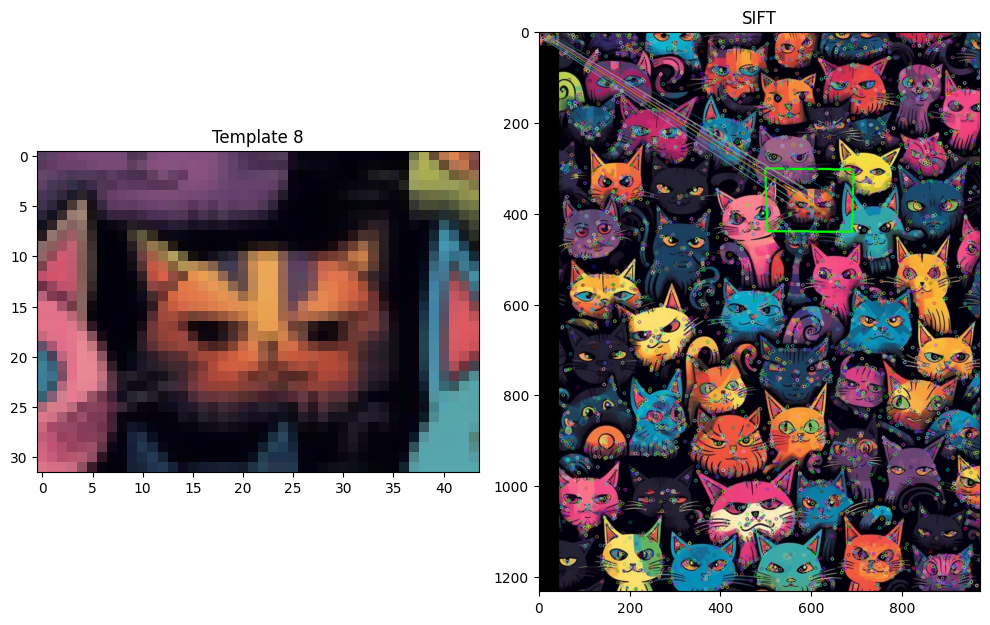

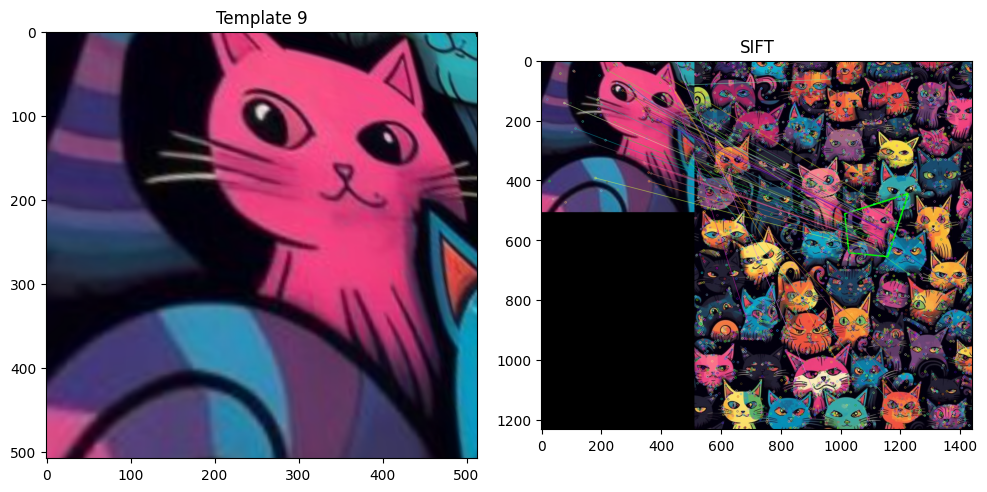

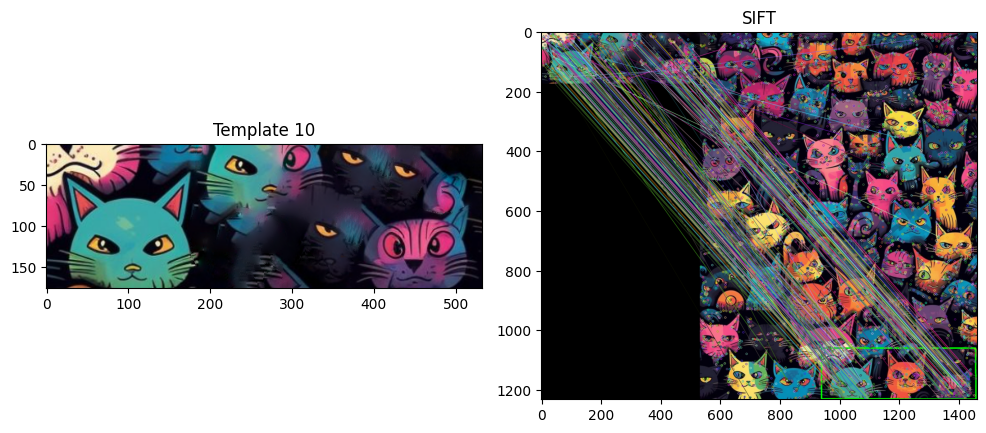

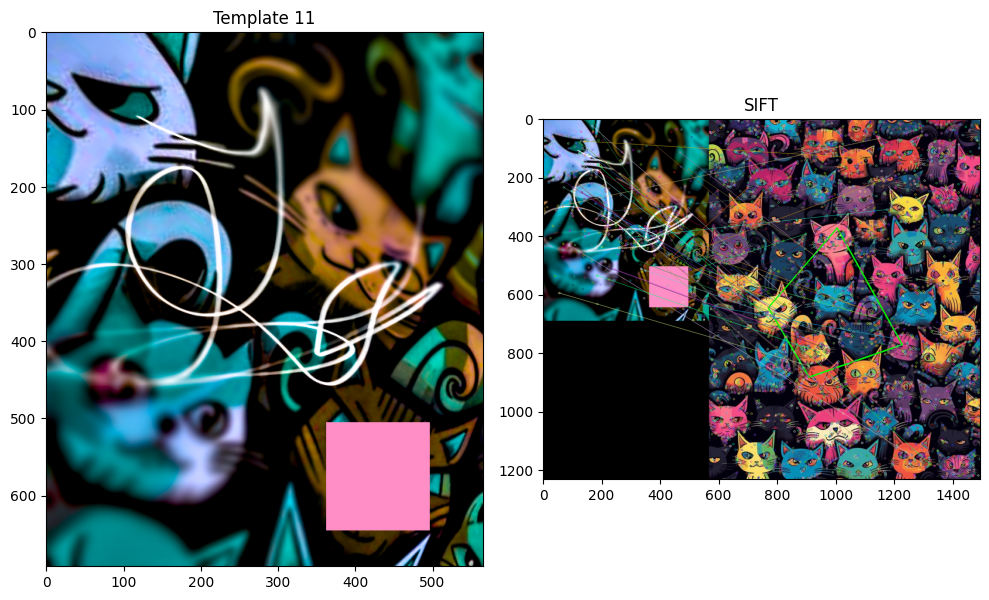

In [8]:
IMAGE_COUNT = 11

template_array = []

for number in range(1, IMAGE_COUNT+1):
    template_array.append(f"../images/lab_2/template_3_{number}.png")

print(template_array)

image = cv2.imread('../images/lab_2/image_3.jpg')

sift = cv2.SIFT_create()

for index, template in enumerate(template_array):
    template = cv2.imread(template)
    template_rgb = cv2.cvtColor(template, cv2.COLOR_BGR2RGB)
    fig, axs = plt.subplots(1, 2, figsize=(10, 10))

    for i, ax in enumerate(axs.flatten()):
        if i == 0:
            ax.imshow(template_rgb)
            ax.set_title(f"Template {index+1}")

        else:
            image_buff = image.copy()

            image_rgb = cv2.cvtColor(image_buff, cv2.COLOR_BGR2RGB)

            input_gray = cv2.cvtColor(image_buff, cv2.COLOR_BGR2GRAY)
            template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

            keypoints_input, descriptors_input = sift.detectAndCompute(input_gray, None)
            keypoints_template, descriptors_template = sift.detectAndCompute(template_gray, None)

            # Используем FLANN для сопоставления дескрипторов
            index_params = dict(algorithm=1, trees=5)
            search_params = dict(checks=50)
            flann = cv2.FlannBasedMatcher(index_params, search_params)
            matches = flann.knnMatch(descriptors_template, descriptors_input, k=2)

            # Отбор хороших совпадений
            good_matches = []
            for m, n in matches:
                if m.distance < 0.75 * n.distance:
                    good_matches.append(m)

            # Проверяем, есть ли 4 совпадения (если меньше, то построить рамку не получится)
            if len(good_matches) >= 4:

                template_points = np.float32([keypoints_template[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
                input_points = np.float32([keypoints_input[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

                # Вычисление матрицы преобразования
                matrix, mask = cv2.findHomography(template_points, input_points, cv2.RANSAC)

                # Преобразуем углы эталона в координаты входного изображения
                input_corners = cv2.perspectiveTransform(np.float32([[0, 0], [0, template.shape[0]], [template.shape[1], template.shape[0]], [template.shape[1], 0]]).reshape(-1, 1, 2), matrix)

                # Рисуем рамку на изображении
                cv2.polylines(image_rgb, [np.int32(input_corners)], isClosed=True, color=(0, 255, 0), thickness=3)

            
            #Рисуем совпадения
            matched_image = cv2.drawMatches(template_rgb, keypoints_template, image_rgb, keypoints_input, good_matches, None)

            ax.imshow(matched_image)
            ax.set_title(f"SIFT")
            plt.tight_layout()
            plt.show()


## Вывод

В результате работы алгоритмов можно сделать вывод, что оба алгоритма (template matching и SIFT) хорошо справляются с определением шаблона, который имеет схожий масштаб и положение с картинкой, на которой производится поиск. Однако если у шаблона изменён размер, он наклонен или повернут относительно картинки, template matching перестаёт справляться с задачей, SIFT в свою очередь всё ещё справляется отлично. SIFT смог правильно определить даже значительно изменённое изображение (изменён цвет, добавлены артефакты, блюр, изменён масштаб, наклон и поворот). Стоит отметить, что единственное слабое место, обнаруженное у SIFT, это сильно заблюренные изображеня, несмотря на то, что алгоритм примерно правильно определил место, рамка вышла сильно хуже, чем у template matching